In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats

# This is an exploration of the Palmer Station penguins dataset 
# https://allisonhorst.github.io/palmerpenguins/
# Horst AM, Hill AP, Gorman KB (2020). palmerpenguins: Palmer Archipelago (Antarctica) penguin data. R package version 0.1.0. https://allisonhorst.github.io/palmerpenguins/. doi: 10.5281/zenodo.3960218.
# https://en.wikipedia.org/wiki/Pygoscelis

# Three hundred brush-tailed penguins were briefly captured
# and subjected to humiliating beak, flipper, and weight measurements 
# so that data science students don't have to look at Ronald Fisher's 
# iris dataset.

In [2]:
# There is a mirror of this dataset in vega-datasets.
# see if I'm allowed to download it by curl...
# curl https://raw.githubusercontent.com/vega/vega-datasets/next/data/penguins.json
!curl -OL https://raw.githubusercontent.com/vega/vega-datasets/next/data/penguins.json 

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:28 --:--:--     0  0      0      0 --:--:--  0:00:01 --:--:--     0-:--  0:00:12 --:--:--     0^C


In [3]:
# Check that the download was data and not a webpage with an error...
!head penguins.json

[
  {
    "Species": "Adelie",
    "Island": "Torgersen",
    "Beak Length (mm)": 39.1,
    "Beak Depth (mm)": 18.7,
    "Flipper Length (mm)": 181,
    "Body Mass (g)": 3750,
    "Sex": "MALE"
  },


In [3]:
penguins = pd.read_json("penguins.json")

In [4]:
penguins

,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,None
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
...,...,...,...,...,...,...,...
339,Gentoo,Biscoe,NaN,NaN,NaN,NaN,None
340,Gentoo,Biscoe,46.8,14.3,215.0,4850.0,FEMALE
341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,MALE
342,Gentoo,Biscoe,45.2,14.8,212.0,5200.0,FEMALE


In [5]:
g = penguins.iloc[np.random.permutation(len(penguins))]
len(penguins) * .25


86.0

In [6]:
penguins_train = g[87:]
penguins_test  = g[:87]
penguins_train.to_csv( "penguins_train.csv")
penguins_test.to_csv( "penguins_test.csv")
penguins = penguins_train
# There is a mistake in this cell that makes it not do what it 
# was intended.  

In [7]:
# Read in the two sets once they are fixed an in a file:
penguins_train=pd.read_csv( "penguins_train.csv")
penguins_test = pd.read_csv( "penguins_test.csv")
penguins = penguins_train


In [8]:
# How many penguins?
penguins.Species.value_counts(), len(penguins)

(Adelie       118
 Gentoo        92
 Chinstrap     47
 Name: Species, dtype: int64,
 257)

In [8]:
penguins.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,257.000000,256.000000,256.000000,256.000000,256.000000
mean,173.319066,44.000000,17.207031,201.433594,4218.261719
std,98.910073,5.615553,1.965574,14.094203,817.487186
min,0.000000,32.100000,13.100000,176.000000,2700.000000
25%,86.000000,39.175000,15.700000,190.000000,3550.000000
50%,174.000000,44.950000,17.300000,197.000000,4050.000000
75%,259.000000,48.725000,18.700000,213.250000,4750.000000
max,343.000000,59.600000,21.500000,231.000000,6300.000000


In [81]:
# Dictionary for painting the dots high-contrast colors
colors = { "Adelie" : "green", "Gentoo": "blue", "Chinstrap": "red"}

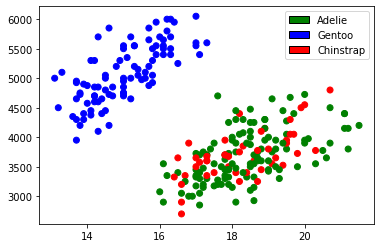

In [82]:
plt.scatter(penguins["Beak Depth (mm)"], penguins["Body Mass (g)"] , color = penguins.Species.map(colors)  )
# Had to look up how to make a legend for this kind of data
# https://matplotlib.org/stable/gallery/text_labels_and_annotations/custom_legends.html
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=c[1], edgecolor='k', label=c[0]) for c in colors.items()]
plt.legend(handles=legend_elements)

<AxesSubplot: xlabel='Beak Depth (mm)', ylabel='Body Mass (g)'>

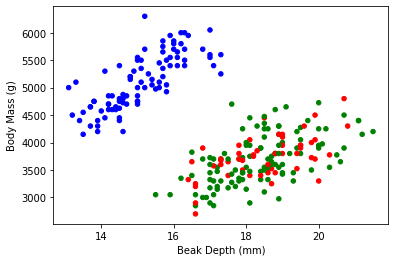

In [11]:
penguins.plot( "Beak Depth (mm)", "Body Mass (g)" , kind="scatter", color = penguins.Species.map(colors)  )

In [10]:
penguins["SP1"] = penguins.Species == "Adelie"
penguins["SP2"] = penguins.Species == "Gentoo"
penguins["SP3"] = penguins.Species == "Chinstrap"
penguins_test["SP1"]= penguins_test.Species == "Adelie"
penguins_test["SP2"]= penguins_test.Species == "Gentoo"
penguins_test["SP3"]= penguins_test.Species == "Chinstrap"

#ONE-HOT ENCODING - WASTES SPACE: 1 value = 1, others = 0

In [11]:
penguins["SP1"].sum(), penguins["SP2"].sum(), penguins["SP3"].sum()

(118, 92, 47)

In [16]:
len(penguins)

257

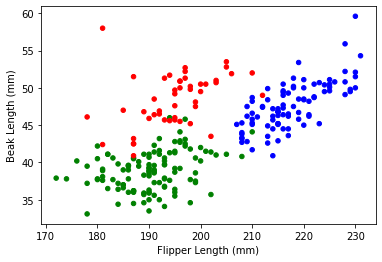

In [12]:
penguins[["Flipper Length (mm)", "Beak Length (mm)"]].plot("Flipper Length (mm)", "Beak Length (mm)", kind="scatter", color = penguins.Species.map(colors))
plt.savefig("PENGUIN.png", dpi=300, bbox_inches="tight")

In [16]:
penguins[["Beak Depth (mm)", "Body Mass (g)"]].values.shape, penguins.SP2.values[:, np.newaxis].shape

((257, 2), (257, 1))

In [19]:
# How do I get this in the right shape?
penguins.SP2.values[:, np.newaxis].shape

(257, 1)

In [14]:
from sklearn.linear_model import LinearRegression

In [107]:
# Ok, ok, I'll clean up my dataframe.. sorry, scipy..

In [13]:
penguinclean = penguins[np.isfinite( penguins["Beak Depth (mm)"]) & 
                        np.isfinite( penguins["Body Mass (g)"]) &
                        np.isfinite( penguins["Flipper Length (mm)"]) & 
                        np.isfinite( penguins["Beak Length (mm)"])]

In [17]:
penguinclean.isnull().any()

Unnamed: 0             False
Species                False
Island                 False
Beak Length (mm)       False
Beak Depth (mm)        False
Flipper Length (mm)    False
Body Mass (g)          False
Sex                     True
SP1                    False
SP2                    False
SP3                    False
dtype: bool

In [15]:
penguins_train = penguins_train[np.isfinite( penguins_train["Beak Depth (mm)"]) & 
                        np.isfinite( penguins_train["Body Mass (g)"]) &
                        np.isfinite( penguins_train["Flipper Length (mm)"]) & 
                        np.isfinite( penguins_train["Beak Length (mm)"])]

In [16]:
penguins_test = penguins_test[np.isfinite( penguins_test["Beak Depth (mm)"]) & 
                              np.isfinite( penguins_test["Body Mass (g)"]) &
                              np.isfinite( penguins_test["Flipper Length (mm)"]) & 
                              np.isfinite( penguins_test["Beak Length (mm)"])]

In [127]:
penguins_train.isnull().any(), len(penguins_test)

(Unnamed: 0             False
 Species                False
 Island                 False
 Beak Length (mm)       False
 Beak Depth (mm)        False
 Flipper Length (mm)    False
 Body Mass (g)          False
 Sex                     True
 SP1                    False
 SP2                    False
 SP3                    False
 dtype: bool,
 86)

In [128]:
penguins_test.isnull().any(), len(penguins_test)

(Unnamed: 0             False
 Species                False
 Island                 False
 Beak Length (mm)       False
 Beak Depth (mm)        False
 Flipper Length (mm)    False
 Body Mass (g)          False
 Sex                     True
 SP1                    False
 SP2                    False
 SP3                    False
 SP1PREDICT             False
 SP1LINEAR              False
 SP2PREDICT             False
 SP2LINEAR              False
 SP3PREDICT             False
 SP3LINEAR              False
 sp1                    False
 sp2                    False
 sp3                    False
 dtype: bool,
 86)

In [27]:
penguins.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,257.000000,256.000000,256.000000,256.000000,256.000000
mean,174.595331,44.063281,17.066797,201.558594,4244.335938
std,100.989091,5.413387,1.964437,14.306604,807.660716
min,0.000000,32.100000,13.100000,172.000000,2900.000000
25%,86.000000,39.450000,15.475000,190.000000,3593.750000
50%,177.000000,44.300000,17.250000,198.000000,4062.500000
75%,261.000000,48.725000,18.600000,215.000000,4812.500000
max,343.000000,58.000000,21.500000,231.000000,6300.000000


In [66]:
# run linear regression... this with just two columns for X
r1 = LinearRegression().fit(penguins_train[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]].values, penguins_train.SP1.values)

In [67]:
b1 = (0.5-r1.intercept_-(r1.coef_[2])*(penguins_train["Flipper Length (mm)"].mean())-(r1.coef_[3])*(penguins_train["Body Mass (g)"].mean()))/r1.coef_[1]

In [68]:
m1 = -(r1.coef_[0])/r1.coef_[1]

In [69]:
x0div1 = np.arange(32,58)
x1div1 = m1*x0div1 + b1

In [70]:
r1.coef_, r1.intercept_

(array([-0.07333383,  0.09551179, -0.00521976,  0.00014716]),
 2.4509118261729244)

In [71]:
# Let us see if I can build the linear classifier out of the 
# coefficients in reg... 
X = penguins_train[["Beak Length (mm)","Beak Depth (mm)"]].values
Y1 = penguins_train.SP1

In [83]:
X.shape

(256, 2)

In [75]:
penguins.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,257.000000,256.000000,256.000000,256.000000,256.000000
mean,171.626459,44.015625,17.213281,201.082031,4217.285156
std,99.319012,5.293458,2.013206,14.134269,801.081715
min,0.000000,32.100000,13.100000,172.000000,2700.000000
25%,87.000000,39.575000,15.500000,190.000000,3568.750000
50%,176.000000,44.500000,17.350000,198.000000,4062.500000
75%,258.000000,48.500000,18.800000,213.000000,4750.000000
max,343.000000,58.000000,21.500000,231.000000,6300.000000


In [72]:
# My linear-leastsquares-fit coefficients were 
#  (array([-0.13720996,  0.00033089]), 1.3226593522496826)
# That's b0, b1, and C...
# yhat = b0 * X[:,0] + b1* X[:,1] + C 
# high school algebra... the boundary is x1div = (0.5 - c) / b1 - b0 /b1 * x0

x0div = np.arange(172,231)
x1div = (0.5 - r1.intercept_)/ r1.coef_[1] - r1.coef_[0] / r1.coef_[1] * x0div

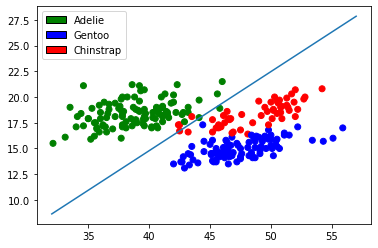

In [73]:
plt.scatter(X[:,0], X[:,1], color=penguins_train.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div1, x1div1)

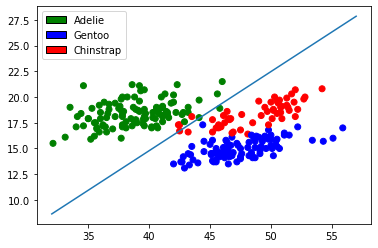

In [74]:
plt.scatter(penguins["Beak Length (mm)"], penguins["Beak Depth (mm)"] , color = penguins.Species.map(colors)  )
plt.legend(handles=legend_elements)
plt.plot(x0div1, x1div1)

In [75]:
r2 = LinearRegression().fit(penguins_train[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]].values, penguins_train.SP2.values)

In [76]:
r2.coef_, r2.intercept_

(array([-0.00208896, -0.12131455,  0.00999978,  0.00020268]),
 -0.3282529644067944)

In [77]:
b2 = (0.5-r2.intercept_-(r2.coef_[2])*(penguins_train["Flipper Length (mm)"].mean())-(r2.coef_[3])*(penguins_train["Body Mass (g)"].mean()))/r2.coef_[1]

In [78]:
m2 = -(r2.coef_[0])/r2.coef_[1]

In [79]:
X = penguins_train[["Beak Length (mm)","Beak Depth (mm)"]].values
Y2 = penguins_train.SP2

In [80]:
x0div2 = np.arange(32,58)
x1div2 = m2*x0div2 + b2

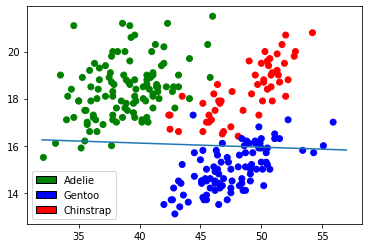

In [81]:
plt.scatter(X[:,0], X[:,1], color=penguins_train.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div2, x1div2)

In [82]:
r3 = LinearRegression().fit(penguins_train[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]].values, penguins_train.SP3.values)

In [83]:
b3 = (0.5-r3.intercept_-(r3.coef_[2])*(penguins_train["Flipper Length (mm)"].mean())-(r3.coef_[3])*(penguins_train["Body Mass (g)"].mean()))/r3.coef_[1]
m3 = -(r3.coef_[0])/r3.coef_[1]

In [84]:
X = penguins_train[["Beak Length (mm)","Beak Depth (mm)"]].values
Y3 = penguins_train.SP3

In [85]:
x0div3 = np.arange(32,58)
x1div3 = m3*x0div3 + b3

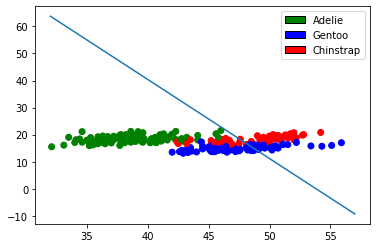

In [86]:
plt.scatter(X[:,0], X[:,1], color=penguins_train.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div3, x1div3)

(12.0, 22.0)

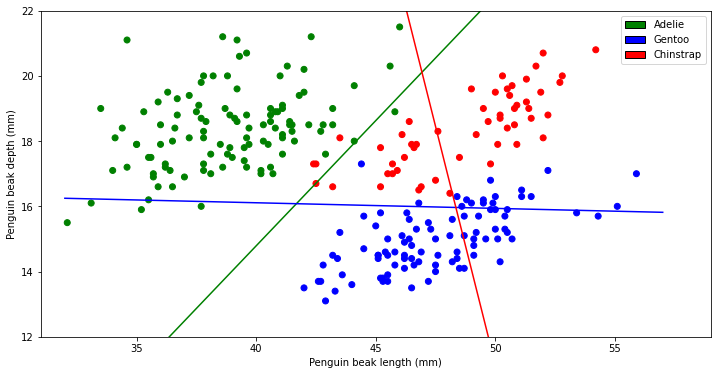

In [87]:
plt.figure(figsize=(12,6))
plt.scatter(X[:,0], X[:,1], color=penguins_train.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div1, x1div1, label = "Ade line", color = "g")
plt.plot(x0div2, x1div2, label = "Chinstrap line", color = "b")
plt.plot(x0div3, x1div3, label = "Chinstrap line", color = "r")
plt.xlabel("Penguin beak length (mm)")
plt.ylabel("Penguin beak depth (mm)")
plt.xlim(31,59)
plt.ylim(12,22)

In [122]:
penguins.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,257.000000,256.000000,256.000000,256.000000,256.000000
mean,171.626459,44.015625,17.213281,201.082031,4217.285156
std,99.319012,5.293458,2.013206,14.134269,801.081715
min,0.000000,32.100000,13.100000,172.000000,2700.000000
25%,87.000000,39.575000,15.500000,190.000000,3568.750000
50%,176.000000,44.500000,17.350000,198.000000,4062.500000
75%,258.000000,48.500000,18.800000,213.000000,4750.000000
max,343.000000,58.000000,21.500000,231.000000,6300.000000


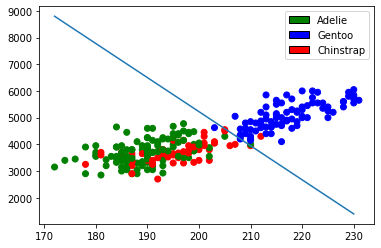

In [51]:
plt.scatter(X[:,0], X[:,1], color=penguinclean.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div, x1div)

In [52]:
r3 = LinearRegression().fit(penguinclean[["Flipper Length (mm)","Body Mass (g)"]].values, penguinclean.SP3.values)

In [54]:
r3.coef_, r3.intercept_

(array([ 0.01079127, -0.00033512]), -0.5428180090816489)

In [55]:
X = penguinclean[["Flipper Length (mm)","Body Mass (g)"]].values
Y = penguinclean.SP3
YHAT = np.dot(X, r3.coef_ ) + r3.intercept_

Text(0, 0.5, 'Adelie linear predictor')

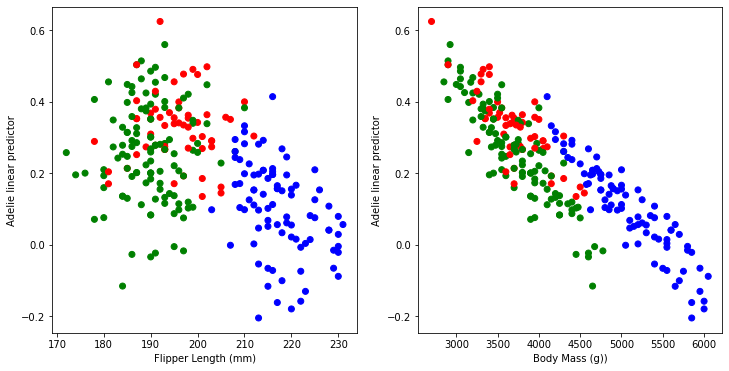

In [56]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.scatter(X[:,0], YHAT, color=penguinclean.Species.map(colors) )
plt.xlabel("Flipper Length (mm)")
plt.ylabel("Adelie linear predictor")

plt.subplot(1,2,2)
plt.scatter(X[:,1], YHAT, color=penguinclean.Species.map(colors) )
plt.xlabel("Body Mass (g))")
plt.ylabel("Adelie linear predictor")

In [57]:
x0div = np.arange(172,231)
x1div = (0.5 - r3.intercept_)/ r3.coef_[1] - r3.coef_[0] / r3.coef_[1] * x0div

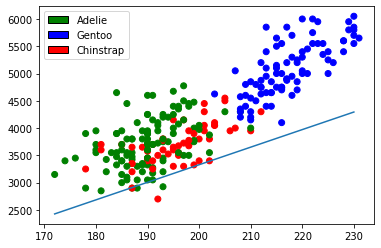

In [58]:
plt.scatter(X[:,0], X[:,1], color=penguinclean.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div, x1div)

In [ ]:
# "Shooting fish in a barrel."

# We took two features, performed linear regression, and 
# used the coefficients to build a linear classifier.

# Gentoo is easy to tell apart from the other two species of brush-tailed penguin.


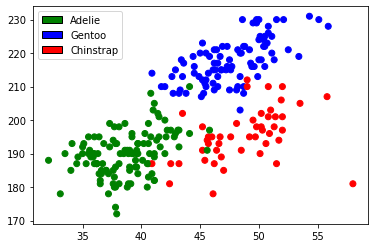

In [123]:
# Other dimensions will be informative about the difference between
# the red and the green birds:
plt.scatter(penguins["Beak Length (mm)"], penguins["Flipper Length (mm)"] , color = penguins.Species.map(colors)  )
plt.legend(handles=legend_elements)
# I can glance at this graph and guess at the locations of the
# lines that would separate each of the three species from the
# rest, but I will need a little ore theory to do three-way classificaiton. 

In [88]:
# Now I'm going to go after a harder problem; Adelie penguins with all four X
reg4_1 = LinearRegression().fit(penguins_train[["Beak Depth (mm)", "Body Mass (g)", "Beak Length (mm)", "Flipper Length (mm)"]].values, penguins_train.SP1.values)

In [137]:
reg4_1.coef_, reg4_1.intercept_

(array([ 0.09510715,  0.00013589, -0.07057009, -0.00561954]),
 2.4680715629637553)

In [138]:
print(["Beak Depth (mm)", "Body Mass (g)", "Beak Length (mm)", "Flipper Length (mm)"])
reg4_1.coef_, reg4_1.intercept_

['Beak Depth (mm)', 'Body Mass (g)', 'Beak Length (mm)', 'Flipper Length (mm)']


(array([ 0.09510715,  0.00013589, -0.07057009, -0.00561954]),
 2.4680715629637553)

In [ ]:
# Can I interpret these coefficients?  I can interpret their signs, of course..
# Three of the measurements are in mm, one is in g, and they have different
# relevant scales.


In [126]:
penguins_train.std()

Unnamed: 0              98.047507
Beak Length (mm)         5.501570
Beak Depth (mm)          1.903730
Flipper Length (mm)     14.405061
Body Mass (g)          816.421390
SP1                      0.498941
SP2                      0.480016
SP3                      0.391669
dtype: float64

In [139]:
# Let's set put the standard deviations of each column of X into an array:
feature_std = np.array([1.964146, 826.402823,  5.046194,  13.464290 ])
# If I arranged the columns correctly, this product 
print(["Beak Depth (mm)", "Body Mass (g)", "Beak Length (mm)", "Flipper Length (mm)"])

reg4_1.coef_ * feature_std


['Beak Depth (mm)', 'Body Mass (g)', 'Beak Length (mm)', 'Flipper Length (mm)']


array([ 0.18680432,  0.1122976 , -0.35611038, -0.07566307])

In [ ]:
# tells us a little more about which fields had more weight.  
# Flipper length and Body mass aren't as weighted as two 
# beak measurements.

In [94]:
SP1PREDICT_train= np.dot( penguins_train[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_1.coef_) + reg4_1.intercept_

In [141]:
penguins_train["SP1PREDICT"] = SP1PREDICT_train > 0.5
penguins_train["SP1LINEAR"] = SP1PREDICT_train 

/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_17243/916277973.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  penguins_train["SP1PREDICT"] = SP1PREDICT_train > 0.5
/var/folders/zb/cqngm18x18v4wmpfr61z84jc0000gn/T/ipykernel_17243/916277973.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  penguins_train["SP1LINEAR"] = SP1PREDICT_train


In [90]:
reg4_1 = LinearRegression().fit(penguins_train[["Beak Depth (mm)", "Body Mass (g)", "Beak Length (mm)", "Flipper Length (mm)"]].values, penguins_train.SP1.values)

In [91]:
SP1PREDICT_test= np.dot( penguins_test[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_1.coef_) + reg4_1.intercept_

In [96]:
penguins_test["SP1PREDICT"] = SP1PREDICT_test > 0.5
penguins_test["SP1LINEAR"] = SP1PREDICT_test 

In [98]:
penguins_test.groupby(["SP1PREDICT", "SP1"]).SP1PREDICT.count()

SP1PREDICT  SP1  
False       False    28
            True     15
True        False    17
            True     26
Name: SP1PREDICT, dtype: int64

In [145]:
len(penguins_train)

256

In [ ]:
# On the training data, which is cheating,  
# Out of 256 penguins, the four-dimensional linear classifier got 252 right
# and 4 wrong on the "is-it-an-Adelie"

In [146]:
penguins_test.groupby(["SP1PREDICT", "SP1"]).SP1PREDICT.count()

SP1PREDICT  SP1  
False       False    24
            True     20
True        False    26
            True     16
Name: SP1PREDICT, dtype: int64

In [99]:
penguins_test.head()

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3,SP1PREDICT,SP1LINEAR
0,304,Gentoo,Biscoe,44.9,13.8,212.0,4750.0,FEMALE,False,False,True,False,0.068711
1,246,Gentoo,Biscoe,44.5,14.3,216.0,4100.0,NaN,False,False,True,False,0.029267
2,133,Adelie,Dream,37.5,18.5,199.0,4475.0,MALE,True,False,False,True,1.087674
3,76,Adelie,Torgersen,40.9,16.8,191.0,3700.0,FEMALE,False,False,True,True,0.603677
4,268,Gentoo,Biscoe,44.9,13.3,213.0,5100.0,FEMALE,True,False,False,False,0.067242


In [100]:
# Since the scores for a binary classifier are in one dimension, 
# I can histogram them



In [152]:
# And they are nicely bimodal.
#  SP1PREDICT_train= np.dot( penguins_train[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg2.coef_) + reg2.intercept_

def penguinspredict(x):
  #  SP1PREDICTION= np.dot( x[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_1.coef_) + reg4_1.intercept_
    SP1PREDICTION= np.dot( x,reg4_1.coef_) + reg4_1.intercept_

    return(SP1PREDICTION > 0.5)


In [153]:
# TEST IT (that penguinspredict does something)
penguinspredict(penguins_train[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values)

array([False, False,  True,  True,  True,  True, False,  True, False,
       False, False, False,  True, False,  True,  True,  True, False,
       False, False, False,  True,  True, False,  True,  True,  True,
       False,  True,  True, False, False,  True,  True,  True,  True,
        True, False, False, False,  True, False, False,  True,  True,
       False,  True, False,  True, False,  True,  True,  True, False,
        True, False, False, False, False, False, False, False, False,
        True, False, False, False,  True, False,  True, False, False,
        True,  True,  True,  True, False, False,  True, False,  True,
       False,  True, False,  True,  True, False, False, False,  True,
        True,  True,  True, False, False,  True, False,  True, False,
       False,  True, False,  True, False,  True, False,  True,  True,
        True,  True,  True, False, False, False,  True, False,  True,
        True, False,  True, False,  True, False, False,  True, False,
       False, False,

In [165]:
def prediction(x):
  #  SP1PREDICTION= np.dot( x[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_1.coef_) + reg4_1.intercept_
    a = np.dot( x,r1.coef_) + r1.intercept_
    b = np.dot( x,r2.coef_) + r2.intercept_
    c = np.dot( x,r3.coef_) + r3.intercept_
    if a>0.5:
        return(0)
    elif b>0.5:
        return(1)
    elif c>0.5:
        return(2)

In [129]:
penguins["SP1"] = penguins.Species == "Adelie"
penguins["SP2"] = penguins.Species == "Gentoo"
penguins["SP3"] = penguins.Species == "Chinstrap"
penguins_test["sp1"]= penguins.Species == "Adelie"
penguins_test["sp2"]= penguins.Species == "Gentoo"
penguins_test["sp3"]= penguins.Species == "Chinstrap"

In [130]:
penguins_train.head()

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,168,Chinstrap,Dream,50.3,20.0,197.0,3300.0,MALE,False,False,True
1,208,Chinstrap,Dream,45.2,16.6,191.0,3250.0,FEMALE,False,False,True
2,52,Adelie,Biscoe,35.0,17.9,190.0,3450.0,FEMALE,True,False,False
3,206,Chinstrap,Dream,42.5,17.3,187.0,3350.0,FEMALE,False,False,True
4,14,Adelie,Torgersen,34.6,21.1,198.0,4400.0,MALE,True,False,False


In [131]:
penguins_test.head()

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3,SP1PREDICT,SP1LINEAR,SP2PREDICT,SP2LINEAR,SP3PREDICT,SP3LINEAR,sp1,sp2,sp3
0,304,Gentoo,Biscoe,44.9,13.8,212.0,4750.0,FEMALE,False,False,True,False,0.068711,True,0.986507,False,-0.055218,False,False,True
1,246,Gentoo,Biscoe,44.5,14.3,216.0,4100.0,NaN,False,False,True,False,0.029267,True,0.834941,False,0.135793,False,False,True
2,133,Adelie,Dream,37.5,18.5,199.0,4475.0,MALE,True,False,False,True,1.087674,False,0.246052,False,-0.333726,True,False,False
3,76,Adelie,Torgersen,40.9,16.8,191.0,3700.0,FEMALE,False,False,True,True,0.603677,False,0.208107,False,0.188215,False,False,True
4,268,Gentoo,Biscoe,44.9,13.3,213.0,5100.0,FEMALE,True,False,False,False,0.067242,True,1.128102,False,-0.195344,True,False,False


In [101]:
reg4_1 = LinearRegression().fit(penguins_train[["Beak Depth (mm)", "Body Mass (g)", "Beak Length (mm)", "Flipper Length (mm)"]].values, penguins_train.SP1.values)
reg4_2 = LinearRegression().fit(penguins_train[["Beak Depth (mm)", "Body Mass (g)", "Beak Length (mm)", "Flipper Length (mm)"]].values, penguins_train.SP2.values)
reg4_3 = LinearRegression().fit(penguins_train[["Beak Depth (mm)", "Body Mass (g)", "Beak Length (mm)", "Flipper Length (mm)"]].values, penguins_train.SP3.values)

In [102]:
SP1PREDICT_test= np.dot( penguins_test[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_1.coef_) + reg4_1.intercept_
SP2PREDICT_test= np.dot( penguins_test[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_2.coef_) + reg4_2.intercept_
SP3PREDICT_test= np.dot( penguins_test[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_3.coef_) + reg4_3.intercept_

In [103]:
penguins_test["SP1PREDICT"] = SP1PREDICT_test > 0.5
penguins_test["SP1LINEAR"] = SP1PREDICT_test 
penguins_test["SP2PREDICT"] = SP2PREDICT_test > 0.5
penguins_test["SP2LINEAR"] = SP2PREDICT_test 
penguins_test["SP3PREDICT"] = SP3PREDICT_test > 0.5
penguins_test["SP3LINEAR"] = SP3PREDICT_test 

In [ ]:
penguins_train.groupby(["SP1PREDICT", "SP1"]).SP1PREDICT.count()

In [137]:
penguins_test=penguins_test.reset_index()
penguins_test

,index,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,...,SP3,SP1PREDICT,SP1LINEAR,SP2PREDICT,SP2LINEAR,SP3PREDICT,SP3LINEAR,sp1,sp2,sp3
0,0,304,Gentoo,Biscoe,44.9,13.8,212.0,4750.0,FEMALE,False,...,True,False,0.068711,True,0.986507,False,-0.055218,False,False,True
1,1,246,Gentoo,Biscoe,44.5,14.3,216.0,4100.0,NaN,False,...,True,False,0.029267,True,0.834941,False,0.135793,False,False,True
2,2,133,Adelie,Dream,37.5,18.5,199.0,4475.0,MALE,True,...,False,True,1.087674,False,0.246052,False,-0.333726,True,False,False
3,3,76,Adelie,Torgersen,40.9,16.8,191.0,3700.0,FEMALE,False,...,True,True,0.603677,False,0.208107,False,0.188215,False,False,True
4,4,268,Gentoo,Biscoe,44.9,13.3,213.0,5100.0,FEMALE,True,...,False,False,0.067242,True,1.128102,False,-0.195344,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,82,116,Adelie,Torgersen,38.6,17.0,188.0,2900.0,FEMALE,True,...,False,True,0.689378,False,-0.003496,False,0.314118,True,False,False
82,83,159,Chinstrap,Dream,51.3,18.2,197.0,3750.0,MALE,False,...,False,False,-0.049238,False,0.086674,True,0.962564,False,True,False
83,84,39,Adelie,Dream,39.8,19.1,184.0,4650.0,MALE,True,...,False,True,1.080363,False,0.053931,False,-0.134294,True,False,False
84,85,155,Chinstrap,Dream,45.4,18.7,188.0,3525.0,FEMALE,True,...,False,False,0.445054,False,-0.097260,True,0.652206,True,False,False


In [138]:
scooby = []
for i in range(len(penguins_test)):
    z = maximum(i)
    scooby.append(z)

In [139]:
dagwood = {"Actual": penguins_test["Species"], "Predicted": scooby}
confusion = pd.DataFrame(dagwood)
confusion

,Actual,Predicted
0,Gentoo,Gentoo
1,Gentoo,Gentoo
2,Adelie,Adelie
3,Adelie,Adelie
4,Gentoo,Gentoo
...,...,...
81,Adelie,Adelie
82,Chinstrap,Chinstrap
83,Adelie,Adelie
84,Chinstrap,Chinstrap


In [143]:
empty = {'Predicted Adelie':[0,0,0], 'Predicted Gentoo':[0,0,0], 'Predicted Chinstrap':[0,0,0]}  
conc = pd.DataFrame(empty, index =['Actual Adelie', 'Actual Gentoo', 'Actual Chinstrap'])  

print(conc)  

                  Predicted Adelie  Predicted Gentoo  Predicted Chinstrap
Actual Adelie                    0                 0                    0
Actual Gentoo                    0                 0                    0
Actual Chinstrap                 0                 0                    0


In [146]:
for i in range(len(confusion)):
    if confusion.Actual[i] == confusion.Predicted[i]:
        if confusion.Actual[i] == "Adelie":
            conc["Predicted Adelie"]["Actual Adelie"]+=1
        elif confusion.Actual[i] == "Gentoo":
            conc["Predicted Gentoo"]["Actual Gentoo"]+=1
        elif confusion.Actual[i] == "Chinstrap":
            conc["Predicted Chinstrap"]["Actual Chinstrap"]+=1
    elif confusion.Actual[i] != confusion.Predicted[i]:
        if confusion.Actual[i] == "Adelie" and confusion.Predicted[i] == "Gentoo":
            conc["Predicted Gentoo"]["Actual Adelie"]+=1
        elif confusion.Actual[i] == "Adelie" and confusion.Predicted[i] == "Chinstrap":
            conc["Predicted Chinstrap"]["Actual Adelie"]+=1
        elif confusion.Actual[i] == "Gentoo" and confusion.Predicted[i] == "Chinstrap":
            conc["Predicted Chinstrap"]["Actual Gentoo"]+=1
        elif confusion.Actual[i] == "Gentoo" and confusion.Predicted[i] == "Adelie":
            conc["Predicted Adelie"]["Actual Gentoo"]+=1
        elif confusion.Actual[i] == "Chinstrap" and confusion.Predicted[i] == "Adelie":
            conc["Predicted Adelie"]["Actual Chinstrap"]+=1
        elif confusion.Actual[i] == "Chinstrap" and confusion.Predicted[i] == "Gentoo":
            conc["Predicted Gentoo"]["Actual Chinstrap"]+=1

In [147]:
conc

,Predicted Adelie,Predicted Gentoo,Predicted Chinstrap
Actual Adelie,42,0,0
Actual Gentoo,0,29,0
Actual Chinstrap,2,0,13


In [ ]:
conc["Predicted Adelie"]["Actual Adelie"]

In [116]:
def maximum(i):
    a = penguins_test["SP1LINEAR"][i]
    b = penguins_test["SP2LINEAR"][i]
    c = penguins_test["SP3LINEAR"][i]
    if max(a,b,c) == a:
        g = "Adelie"
    elif max(a,b,c) == b:
        g = "Gentoo"
    elif max(a,b,c) == c:
        g = "Chinstrap"
    return(g)

In [117]:
maximum(0)

'Gentoo'

In [150]:
mean0 = penguins_train["Beak Depth (mm)"].mean()
mean1 = penguins_train["Body Mass (g)"].mean() 
mean2 = penguins_train['Beak Length (mm)'].mean()
mean3 = penguins_train["Flipper Length (mm)"].mean()


In [174]:
xgrid = np.arange(32.1, 56,0.5) # range for beak length
ygrid = np.arange(13.1,21.6,0.5)  # range for beak depth
xax, yax = np.meshgrid(xgrid, ygrid, indexing="ij")
z = np.zeros(xax.shape)
print(xax.shape, yax.shape, z.shape)
for i in range(len(xgrid)):
    for j in range(len(ygrid)):
        x = np.array([mean0, mean1, ygrid[j], xgrid[i]])
       # print(x)
        z[i,j]= penguinspredict(x)


(48, 18) (48, 18) (48, 18)


In [194]:
penguins.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,257.000000,256.000000,256.000000,256.000000,256.000000
mean,172.688716,44.066406,17.134375,201.207031,4214.062500
std,100.330257,5.339057,1.975435,14.016241,811.901363
min,0.000000,32.100000,13.100000,174.000000,2700.000000
25%,85.000000,39.600000,15.500000,190.000000,3550.000000
50%,176.000000,45.100000,17.300000,197.000000,4050.000000
75%,258.000000,48.625000,18.600000,214.000000,4850.000000
max,343.000000,55.900000,21.500000,231.000000,6300.000000


In [181]:
def penguinspredict(x):
  #  SP1PREDICTION= np.dot( x[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_1.coef_) + reg4_1.intercept_
    SP1PREDICTION= np.dot( x,reg4_1.coef_) + reg4_1.intercept_

    return(SP1PREDICTION > 0.5)

array([  17.134375, 4214.0625  ,   21.6     ,   55.6     ])

In [182]:
xgrid = np.arange(32.1, 56,0.5) # range for beak length
ygrid = np.arange(13.1,21.6,0.5)  # range for beak depth
xax, yax = np.meshgrid(xgrid, ygrid, indexing="ij")
z = np.zeros(xax.shape)

In [184]:
z.shape

(48, 18)

In [200]:
def predictor(i):
    a = reg4_1.coef_[2]*i[0] + reg4_1.coef_[0]*i[1]
    b = reg4_2.coef_[2]*i[0] + reg4_2.coef_[0]*i[1]
    c = reg4_3.coef_[2]*i[0] + reg4_3.coef_[0]*i[1]
    if max(a,b,c) == a:
        return(0)
    elif max(a,b,c) == b:
        return(1)
    else:
        return(2)

In [201]:
xgrid = np.arange(32.1, 56,0.5) # range for beak length
ygrid = np.arange(13.1,21.6,0.5)  # range for beak depth
xax, yax = np.meshgrid(xgrid, ygrid, indexing="ij")
z = np.zeros(xax.shape)
print(xax.shape, yax.shape, z.shape)
for i in range(len(xgrid)):
    for j in range(len(ygrid)):
        x = np.array([xgrid[i], ygrid[j]])
       # print(x)
        z[i,j]= predictor(x)

(48, 18) (48, 18) (48, 18)


In [204]:
x

array([55.6, 21.6])

In [191]:
reg4_1 = LinearRegression().fit(penguins_train[["Beak Depth (mm)", "Body Mass (g)", "Beak Length (mm)", "Flipper Length (mm)"]].values, penguins_train.SP1.values)
reg4_1.coef_

array([ 0.09551179,  0.00014716, -0.07333383, -0.00521976])

In [175]:
SP1PREDICT_test= np.dot( penguins_test[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_1.coef_) + reg4_1.intercept_

In [176]:
SP1PREDICT_test

array([ 0.06871094,  0.02926657,  1.08767429,  0.60367746,  0.06724168,
        0.86801674,  0.39242127,  0.90671699,  0.75862326,  0.12540069,
        0.02040996, -0.06309059, -0.18934045,  1.06717835,  1.00085567,
        0.88138393,  0.69361857,  1.01254582, -0.60630491,  1.19035183,
        0.23541558,  0.8802931 ,  0.94844466,  1.01383706, -0.04235087,
        1.07080352,  0.00611402, -0.26067003,  0.20027328,  0.96369147,
        0.32733944,  1.0458433 ,  1.34048536,  0.87671757,  0.29585319,
        0.78163864, -0.31280081,  0.47559314,  0.98615317,  1.10032944,
        0.993953  , -0.0428887 , -0.10816725,  0.96687525,  0.20517003,
        0.4142174 , -0.24182913,  0.69052094,  0.94524963,  1.02684445,
        0.08744271,  0.84819611,  0.05025664,  0.03470181, -0.12988176,
        0.0999872 ,  0.27262906, -0.0384911 ,  0.11358588,  0.92779344,
        0.46592661, -0.07585248,  0.20844509,  0.01190334,  0.91168464,
       -0.06539358,  0.75944669, -0.5026216 , -0.13184833,  0.81

Text(0, 0.5, 'Beak Depth (mm)')

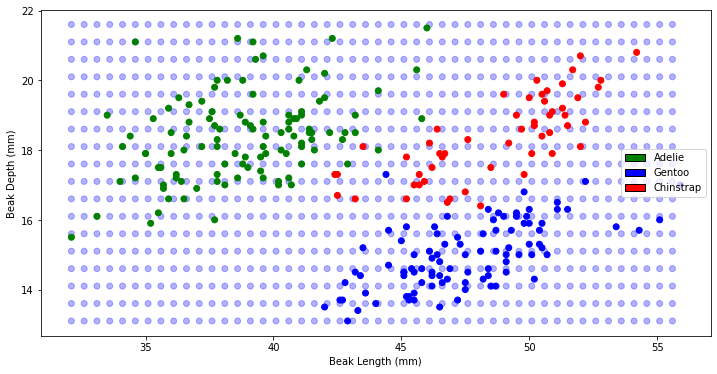

In [179]:
colorsnum = { 0 : "green", 1: "blue", 2: "red"}
c = [colorsnum[i] for i in z.reshape(-1)]
plt.figure(figsize=(12,6))
plt.scatter(xax,yax, color=c, alpha=0.3)
plt.scatter(penguins["Beak Length (mm)"], penguins["Beak Depth (mm)"] , color = penguins.Species.map(colors)  )
plt.legend(handles=legend_elements)
plt.xlabel("Beak Length (mm)")
plt.ylabel( "Beak Depth (mm)")

In [ ]:
SP1PREDICT_test= np.dot( penguins_test[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_1.coef_) + reg4_1.intercept_
SP2PREDICT_test= np.dot( penguins_test[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_2.coef_) + reg4_2.intercept_
SP3PREDICT_test= np.dot( penguins_test[["Beak Depth (mm)", "Body Mass (g)", 'Beak Length (mm)', "Flipper Length (mm)"]].values,reg4_3.coef_) + reg4_3.intercept_

In [38]:
penguins

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,174,Chinstrap,Dream,43.2,16.6,187.0,2900.0,FEMALE,False,False,True
1,151,Adelie,Dream,41.5,18.5,201.0,4000.0,MALE,True,False,False
2,156,Chinstrap,Dream,52.7,19.8,197.0,3725.0,MALE,False,False,True
3,206,Chinstrap,Dream,42.5,17.3,187.0,3350.0,FEMALE,False,False,True
4,233,Gentoo,Biscoe,48.4,14.6,213.0,5850.0,MALE,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...
252,98,Adelie,Dream,33.1,16.1,178.0,2900.0,FEMALE,True,False,False
253,39,Adelie,Dream,39.8,19.1,184.0,4650.0,MALE,True,False,False
254,317,Gentoo,Biscoe,46.9,14.6,222.0,4875.0,FEMALE,False,True,False
255,80,Adelie,Torgersen,34.6,17.2,189.0,3200.0,FEMALE,True,False,False


In [39]:
penguins = penguins.replace(True,1).replace(False,0)
penguins

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,174,Chinstrap,Dream,43.2,16.6,187.0,2900.0,FEMALE,0,0,1
1,151,Adelie,Dream,41.5,18.5,201.0,4000.0,MALE,1,0,0
2,156,Chinstrap,Dream,52.7,19.8,197.0,3725.0,MALE,0,0,1
3,206,Chinstrap,Dream,42.5,17.3,187.0,3350.0,FEMALE,0,0,1
4,233,Gentoo,Biscoe,48.4,14.6,213.0,5850.0,MALE,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
252,98,Adelie,Dream,33.1,16.1,178.0,2900.0,FEMALE,1,0,0
253,39,Adelie,Dream,39.8,19.1,184.0,4650.0,MALE,1,0,0
254,317,Gentoo,Biscoe,46.9,14.6,222.0,4875.0,FEMALE,0,1,0
255,80,Adelie,Torgersen,34.6,17.2,189.0,3200.0,FEMALE,1,0,0


Text(0.5, 0, 'Weight')

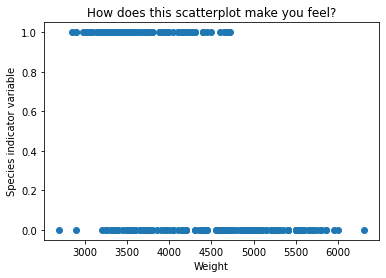

In [40]:
plt.scatter(penguins["Body Mass (g)"], penguins["SP1"])
plt.title ("How does this scatterplot make you feel?")
plt.ylabel("Species indicator variable")
plt.xlabel("Weight")

In [50]:
import sklearn
from sklearn.linear_model import LogisticRegression

In [50]:
model = LogisticRegression()
model.fit(x_fit,y_fit)

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [27]:
int(True)

1

In [53]:
training = penguins_train.dropna()

In [49]:
data = {"1": training["Beak Length (mm)"],"2": training["Beak Depth (mm)"],"3": training["Flipper Length (mm)"], "4": training["Body Mass (g)"]}
x_fit = pd.DataFrame(data)
y_fit = training["SP1"]

In [47]:
model = LogisticRegression()
model.fit(x_fit,y_fit)

LogisticRegression()

In [137]:
training

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,122,Adelie,Torgersen,40.2,17.0,176.0,3450.0,FEMALE,True,False,False
1,190,Chinstrap,Dream,46.9,16.6,192.0,2700.0,FEMALE,False,False,True
2,176,Chinstrap,Dream,46.7,17.9,195.0,3300.0,FEMALE,False,False,True
3,166,Chinstrap,Dream,45.9,17.1,190.0,3575.0,FEMALE,False,False,True
4,305,Gentoo,Biscoe,50.8,17.3,228.0,5600.0,MALE,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...
252,320,Gentoo,Biscoe,48.5,15.0,219.0,4850.0,FEMALE,False,True,False
253,20,Adelie,Biscoe,37.8,18.3,174.0,3400.0,FEMALE,True,False,False
254,16,Adelie,Torgersen,38.7,19.0,195.0,3450.0,FEMALE,True,False,False
255,13,Adelie,Torgersen,38.6,21.2,191.0,3800.0,MALE,True,False,False


In [54]:
doof = training.head(10)
doof

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,174,Chinstrap,Dream,43.2,16.6,187.0,2900.0,FEMALE,False,False,True
1,151,Adelie,Dream,41.5,18.5,201.0,4000.0,MALE,True,False,False
2,156,Chinstrap,Dream,52.7,19.8,197.0,3725.0,MALE,False,False,True
3,206,Chinstrap,Dream,42.5,17.3,187.0,3350.0,FEMALE,False,False,True
4,233,Gentoo,Biscoe,48.4,14.6,213.0,5850.0,MALE,False,True,False
5,240,Gentoo,Biscoe,50.2,14.3,218.0,5700.0,MALE,False,True,False
6,275,Gentoo,Biscoe,45.0,15.4,220.0,5050.0,MALE,False,True,False
7,122,Adelie,Torgersen,40.2,17.0,176.0,3450.0,FEMALE,True,False,False
8,92,Adelie,Dream,34.0,17.1,185.0,3400.0,FEMALE,True,False,False
9,112,Adelie,Biscoe,39.7,17.7,193.0,3200.0,FEMALE,True,False,False


In [53]:
clf1 = LogisticRegression(random_state=0).fit(training["Beak Length (mm)"].values.reshape([-1,1]), training.SP1.values.reshape([-1,1]))

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [54]:
doog = LogisticRegression(random_state=0).fit(x_fit.values.reshape([-1,1]), training.SP1.values.reshape([-1,1]))

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


ValueError: Found input variables with inconsistent numbers of samples: [1004, 251]

In [50]:
clf1.coef_

array([[-1.13669692]])

In [51]:
clf1.intercept_

array([48.70566709])

In [52]:
x_fit

,1,2,3,4
0,43.2,16.6,187.0,2900.0
1,41.5,18.5,201.0,4000.0
2,52.7,19.8,197.0,3725.0
3,42.5,17.3,187.0,3350.0
4,48.4,14.6,213.0,5850.0
...,...,...,...,...
252,33.1,16.1,178.0,2900.0
253,39.8,19.1,184.0,4650.0
254,46.9,14.6,222.0,4875.0
255,34.6,17.2,189.0,3200.0


In [130]:
penguins.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,257.000000,256.000000,256.000000,256.000000,256.000000
mean,171.626459,44.015625,17.213281,201.082031,4217.285156
std,99.319012,5.293458,2.013206,14.134269,801.081715
min,0.000000,32.100000,13.100000,172.000000,2700.000000
25%,87.000000,39.575000,15.500000,190.000000,3568.750000
50%,176.000000,44.500000,17.350000,198.000000,4062.500000
75%,258.000000,48.500000,18.800000,213.000000,4750.000000
max,343.000000,58.000000,21.500000,231.000000,6300.000000


In [140]:
reggie1 = LogisticRegression().fit(training[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]].values, training.SP1.values)

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [75]:
reggie.coef_, reggie.intercept_

(array([[ 2.31086920e+00,  9.68341184e-04, -1.35132740e+00,
          6.99609807e-02]]),
 array([0.04969449]))

In [141]:
reggie.coef_, reggie.intercept_

(array([[-1.75911394e+00,  2.15390858e+00,  5.20070914e-02,
          1.69324893e-03]]),
 array([20.8943809]))

In [ ]:
l1 = 1 / (1+np.exp( - reg1.coef_[0][0] * training["Beak Depth (mm)"] - reg1.intercept_[0]))

In [88]:
reg1 = LogisticRegression().fit(training[["Beak Depth (mm)"]].values, training.SP1.values)

In [89]:
logistic = 1 / (1+np.exp( - reg1.coef_[0][0] * training["Beak Depth (mm)"] - reg1.intercept_[0]))

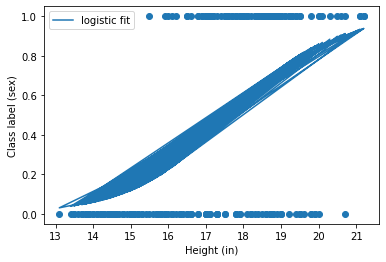

In [90]:
plt.scatter(training[["Beak Depth (mm)"]], training.SP1)
plt.plot(training[["Beak Depth (mm)"]], logistic, label="logistic fit")
plt.ylabel("Class label (sex)")
plt.xlabel("Height (in)")
plt.legend()
plt.savefig("Linear-galton2.png")

In [83]:
reg1.coef_[0][0]

0.761265417772798

In [84]:
reg1.intercept_[0]

-13.423581131046431

In [62]:
reggie1 = LogisticRegression().fit(penguinclean[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]].values, penguinclean.SP1.values)

In [63]:
reggie1.coef_[0]

array([-1.43013960e+00,  2.36573677e+00,  7.90773859e-02,  1.20784229e-03])

In [59]:
reggie1.intercept_[0]

0.0495091614920463

In [81]:
r1 = (-reggie1.intercept_[0]-(reggie1.coef_[0][2])*(training["Flipper Length (mm)"].mean())-(reggie1.coef_[0][3])*(training["Body Mass (g)"].mean()))/reggie1.coef_[0][1]
q1 = -(reggie1.coef_[0][0])/reggie1.coef_[0][1]

In [82]:
X = penguinclean[["Beak Length (mm)","Beak Depth (mm)"]].values
Y1 = penguinclean.SP1

In [83]:
x0div4 = np.arange(32,58)
x1div4 = q1*x0div4 + r1

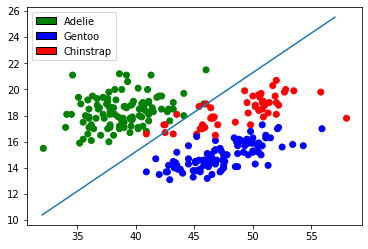

In [84]:
plt.scatter(X[:,0], X[:,1], color=penguinclean.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div4, x1div4)

In [68]:
reggie2 = LogisticRegression().fit(penguinclean[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]].values, penguinclean.SP2.values)

In [197]:
r2 = (-reggie2.intercept_[0]-(reggie2.coef_[0][2])*(training["Flipper Length (mm)"].mean())-(reggie2.coef_[0][3])*(training["Body Mass (g)"].mean()))/reggie2.coef_[0][1]
q2 = -(reggie2.coef_[0][0])/reggie2.coef_[0][1]

In [198]:
X = penguinclean[["Beak Length (mm)","Beak Depth (mm)"]].values
Y2 = penguinclean.SP2

In [77]:
x0div5 = np.arange(32,58)
x1div5 = q2*x0div5 + r2

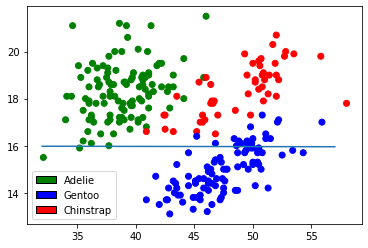

In [79]:
plt.scatter(X[:,0], X[:,1], color=penguinclean.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div5, x1div5)

In [191]:
reggie3 = LogisticRegression().fit(penguinclean[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]].values, penguinclean.SP3.values)

In [196]:
r3 = (-reggie3.intercept_[0]-(reggie3.coef_[0][2])*(training["Flipper Length (mm)"].mean())-(reggie3.coef_[0][3])*(training["Body Mass (g)"].mean()))/reggie3.coef_[0][1]
q3 = -(reggie3.coef_[0][0])/reggie3.coef_[0][1]

In [194]:
X = penguinclean[["Beak Length (mm)","Beak Depth (mm)"]].values
Y3 = penguinclean.SP3

In [200]:
x0div6 = np.arange(32,58)
x1div6 = q3*x0div6 + r3

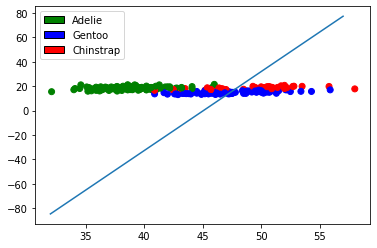

In [201]:
plt.scatter(X[:,0], X[:,1], color=penguinclean.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div6, x1div6)

(12.0, 22.0)

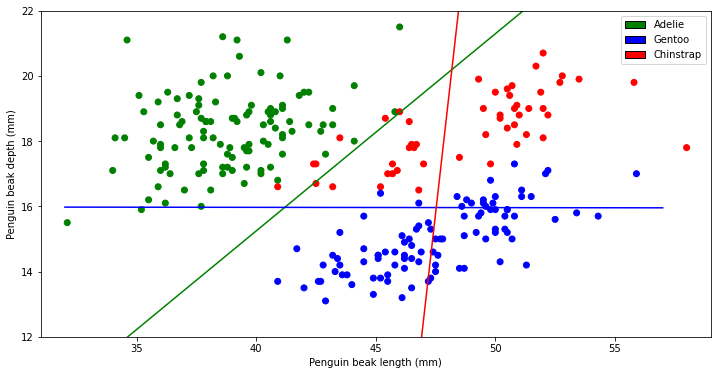

In [202]:
plt.figure(figsize=(12,6))
plt.scatter(X[:,0], X[:,1], color=penguins_train.Species.map(colors) )
plt.legend(handles=legend_elements)
plt.plot(x0div4, x1div4, label = "Ade line", color = "g")
plt.plot(x0div5, x1div5, label = "Chinstrap line", color = "b")
plt.plot(x0div6, x1div6, label = "Chinstrap line", color = "r")
plt.xlabel("Penguin beak length (mm)")
plt.ylabel("Penguin beak depth (mm)")
plt.xlim(31,59)
plt.ylim(12,22)

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats
from sklearn import datasets

In [19]:
penguinclean

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,287,Gentoo,Biscoe,49.5,16.2,229.0,5800.0,MALE,False,True,False
1,307,Gentoo,Biscoe,51.3,14.2,218.0,5300.0,MALE,False,True,False
2,291,Gentoo,Biscoe,46.4,15.6,221.0,5000.0,MALE,False,True,False
3,53,Adelie,Biscoe,42.0,19.5,200.0,4050.0,MALE,True,False,False
4,86,Adelie,Dream,36.3,19.5,190.0,3800.0,MALE,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...
252,323,Gentoo,Biscoe,49.1,15.0,228.0,5500.0,MALE,False,True,False
253,270,Gentoo,Biscoe,46.6,14.2,210.0,4850.0,FEMALE,False,True,False
254,1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE,True,False,False
255,169,Chinstrap,Dream,58.0,17.8,181.0,3700.0,FEMALE,False,False,True


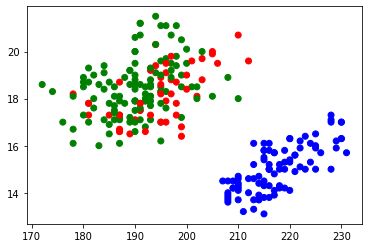

In [20]:
plt.scatter(penguinclean["Flipper Length (mm)"], penguinclean["Beak Depth (mm)"] , color = penguinclean.Species.map(colors)  )

In [96]:
trial = penguinclean[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]].copy()
trial

,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
0,49.8,17.3,198.0,3675.0
1,50.0,19.5,196.0,3900.0
2,42.8,14.2,209.0,4700.0
3,51.3,18.2,197.0,3750.0
4,36.0,17.1,187.0,3700.0
...,...,...,...,...
252,40.6,18.8,193.0,3800.0
253,53.4,15.8,219.0,5500.0
254,45.7,17.3,193.0,3600.0
255,50.5,19.6,201.0,4050.0


In [98]:
clown = trial.values.tolist()
clown

[[49.8, 17.3, 198.0, 3675.0],
 [50.0, 19.5, 196.0, 3900.0],
 [42.8, 14.2, 209.0, 4700.0],
 [51.3, 18.2, 197.0, 3750.0],
 [36.0, 17.1, 187.0, 3700.0],
 [42.5, 16.7, 187.0, 3350.0],
 [37.6, 17.0, 185.0, 3600.0],
 [42.6, 13.7, 213.0, 4950.0],
 [36.0, 17.9, 190.0, 3450.0],
 [45.2, 13.8, 215.0, 4750.0],
 [43.5, 15.2, 213.0, 4650.0],
 [39.6, 17.2, 196.0, 3550.0],
 [49.5, 16.2, 229.0, 5800.0],
 [39.6, 17.7, 186.0, 3500.0],
 [39.2, 18.6, 190.0, 4250.0],
 [51.3, 14.2, 218.0, 5300.0],
 [41.1, 18.1, 205.0, 4300.0],
 [45.5, 13.7, 214.0, 4650.0],
 [37.7, 18.7, 180.0, 3600.0],
 [38.8, 17.6, 191.0, 3275.0],
 [45.1, 14.5, 215.0, 5000.0],
 [50.2, 18.7, 198.0, 3775.0],
 [47.2, 13.7, 214.0, 4925.0],
 [46.8, 14.3, 215.0, 4850.0],
 [34.0, 17.1, 185.0, 3400.0],
 [42.8, 18.5, 195.0, 4250.0],
 [36.7, 18.8, 187.0, 3800.0],
 [50.5, 18.4, 200.0, 3400.0],
 [50.6, 19.4, 193.0, 3800.0],
 [39.0, 18.7, 185.0, 3650.0],
 [46.8, 15.4, 215.0, 5150.0],
 [42.7, 18.3, 196.0, 4075.0],
 [39.7, 17.9, 193.0, 4250.0],
 [52.5, 15

In [101]:
precision = np.linalg.inv(np.cov(clown))
precision.shape

(256, 256)

In [104]:
pip install -U scikit-learn

     |████████████████████████████████| 9.1 MB 8.3 MB/s eta 0:00:01
     |████████████████████████████████| 297 kB 11.1 MB/s eta 0:00:01
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.0
    Uninstalling joblib-1.1.0:
      Successfully uninstalled joblib-1.1.0
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.24.2
    Uninstalling scikit-learn-0.24.2:
      Successfully uninstalled scikit-learn-0.24.2
Note: you may need to restart the kernel to use updated packages.


In [24]:
penguins_train

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,175,Chinstrap,Dream,50.6,19.4,193.0,3800.0,MALE,False,False,True
1,249,Gentoo,Biscoe,50.0,15.3,220.0,5550.0,MALE,False,True,False
2,257,Gentoo,Biscoe,44.4,17.3,219.0,5250.0,MALE,False,True,False
3,253,Gentoo,Biscoe,59.6,17.0,230.0,6050.0,MALE,False,True,False
4,119,Adelie,Torgersen,41.1,18.6,189.0,3325.0,MALE,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...
252,341,Gentoo,Biscoe,50.4,15.7,222.0,5750.0,MALE,False,True,False
253,273,Gentoo,Biscoe,50.1,15.0,225.0,5000.0,MALE,False,True,False
254,316,Gentoo,Biscoe,49.4,15.8,216.0,4925.0,MALE,False,True,False
255,181,Chinstrap,Dream,52.8,20.0,205.0,4550.0,MALE,False,False,True


In [23]:
train1  = penguins_train[penguins_train["SP1"] == True]

In [74]:
from scipy.stats import multivariate_normal

In [73]:
rv = multivariate_normal([np.mean(train1["Beak Length (mm)"]),np.mean(train1["Beak Depth (mm)"])], np.cov(train1["Beak Length (mm)"],train1["Beak Depth (mm)"]))

In [75]:
def density1(x):
    d1 = multivariate_normal(x,[np.mean(train1["Beak Length (mm)"]),np.mean(train1["Beak Depth (mm)"])], np.cov(train1["Beak Length (mm)"],train1["Beak Depth (mm)"]))
    return d1

In [30]:
train1.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,105.000000,105.000000,105.000000,105.000000,105.000000
mean,75.247619,38.824762,18.420000,189.761905,3710.476190
std,45.246500,2.704582,1.234784,6.191688,469.730141
min,0.000000,32.100000,15.500000,172.000000,2850.000000
25%,35.000000,36.900000,17.500000,186.000000,3350.000000
50%,75.000000,38.700000,18.500000,190.000000,3700.000000
75%,115.000000,40.600000,19.100000,194.000000,4075.000000
max,150.000000,46.000000,21.500000,208.000000,4775.000000


In [46]:
x = np.arange(32.1,46.1, 0.1)  # range for feature 1
y = np.arange(15.5,21.6, 0.1)  # range for feature 2 

In [72]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(X, Y, rv.pdf(pos),cmap='viridis',linewidth=0)
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
plt.show()

TypeError: gca() got an unexpected keyword argument 'projection'

<Figure size 432x288 with 0 Axes>

In [47]:
data = np.dstack((x,y))

In [43]:
y

array([15.5, 15.6, 15.7, 15.8, 15.9, 16. , 16.1, 16.2, 16.3, 16.4, 16.5,
       16.6, 16.7, 16.8, 16.9, 17. , 17.1, 17.2, 17.3, 17.4, 17.5, 17.6,
       17.7, 17.8, 17.9, 18. , 18.1, 18.2, 18.3, 18.4, 18.5, 18.6, 18.7,
       18.8, 18.9, 19. , 19.1, 19.2, 19.3, 19.4, 19.5, 19.6, 19.7, 19.8,
       19.9, 20. , 20.1, 20.2, 20.3, 20.4, 20.5, 20.6, 20.7, 20.8, 20.9,
       21. , 21.1, 21.2, 21.3, 21.4])

TypeError: Input z must be 2D, not 1D

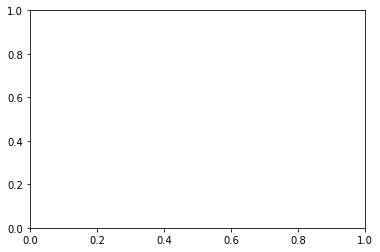

In [48]:
z = rv.pdf(data)
plt.contourf(x, y, z, cmap='coolwarm')
plt.show()

In [89]:
train1.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,118.000000,118.000000,118.000000,118.000000,118.000000
mean,75.745763,38.889831,18.411864,190.288136,3693.855932
std,45.337328,2.615221,1.215229,6.898658,448.143564
min,0.000000,33.100000,16.000000,172.000000,2850.000000
25%,36.250000,37.000000,17.600000,186.000000,3350.000000
50%,74.000000,38.950000,18.350000,190.000000,3650.000000
75%,117.750000,40.775000,19.075000,195.000000,3993.750000
max,151.000000,46.000000,21.500000,210.000000,4725.000000


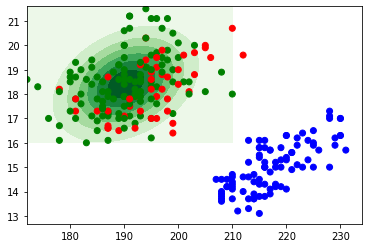

In [91]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

x, y = np.mgrid[172:210.1:.1, 16:21.7:.1]
rv = multivariate_normal([np.mean(train1["Flipper Length (mm)"]),np.mean(train1["Beak Depth (mm)"])], np.cov(train1["Flipper Length (mm)"],train1["Beak Depth (mm)"]))
data = np.dstack((x, y))
z = rv.pdf(data)
plt.contourf(x, y, z, cmap='Greens')
plt.scatter(penguins_train["Flipper Length (mm)"], penguins_train["Beak Depth (mm)"] , color = penguins_train.Species.map(colors)  )
plt.show()

In [92]:
train2  = penguins_train[penguins_train["SP2"] == True]
train2.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,91.000000,91.000000,91.000000,91.000000,91.000000
mean,282.549451,47.635165,15.023077,217.450549,5080.494505
std,35.103423,3.187314,1.000564,6.408785,499.037994
min,220.000000,40.900000,13.100000,207.000000,3950.000000
25%,254.000000,45.250000,14.200000,213.000000,4712.500000
50%,282.000000,47.400000,15.000000,216.000000,5000.000000
75%,313.500000,49.850000,15.800000,221.500000,5500.000000
max,343.000000,59.600000,17.300000,231.000000,6050.000000


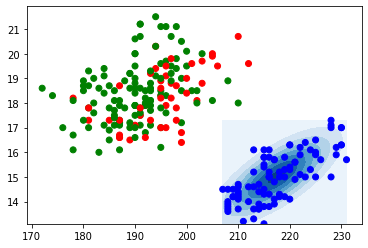

In [93]:
x2, y2 = np.mgrid[207:231:.1, 13.1:17.4:.1]
rv2 = multivariate_normal([np.mean(train2["Flipper Length (mm)"]),np.mean(train2["Beak Depth (mm)"])], np.cov(train2["Flipper Length (mm)"],train2["Beak Depth (mm)"]))
data2 = np.dstack((x2, y2))
z2 = rv2.pdf(data2)
plt.contourf(x2, y2, z2, cmap='Blues')
plt.scatter(penguins_train["Flipper Length (mm)"], penguins_train["Beak Depth (mm)"] , color = penguins_train.Species.map(colors)  )
plt.show()

In [30]:
train3  = penguins_train[penguins_train["SP3"] == True]
train3.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,47.000000,47.000000,47.000000,47.000000,47.000000
mean,184.297872,48.442553,18.248936,195.063830,3704.255319
std,19.521354,3.505136,1.160186,7.215335,403.292130
min,152.000000,40.900000,16.400000,178.000000,2700.000000
25%,168.000000,45.950000,17.300000,191.000000,3475.000000
50%,185.000000,49.000000,18.200000,195.000000,3675.000000
75%,200.500000,50.950000,19.150000,199.000000,3900.000000
max,219.000000,58.000000,20.700000,212.000000,4800.000000


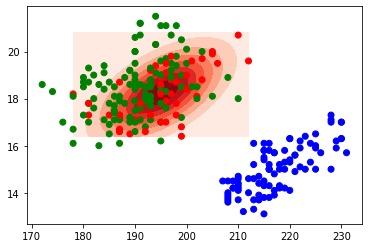

In [94]:
x3, y3 = np.mgrid[178:212.1:.1, 16.4:20.8:.1]
rv3 = multivariate_normal([np.mean(train3["Flipper Length (mm)"]),np.mean(train3["Beak Depth (mm)"])], np.cov(train3["Flipper Length (mm)"],train3["Beak Depth (mm)"]))
data3 = np.dstack((x3, y3))
z3 = rv3.pdf(data3)
plt.contourf(x3, y3, z3, cmap='Reds')
plt.scatter(penguins_train["Flipper Length (mm)"], penguins_train["Beak Depth (mm)"] , color = penguins_train.Species.map(colors)  )
plt.show()

In [77]:
data3.shape

(150, 45, 2)

In [78]:
z.shape

(140, 62)

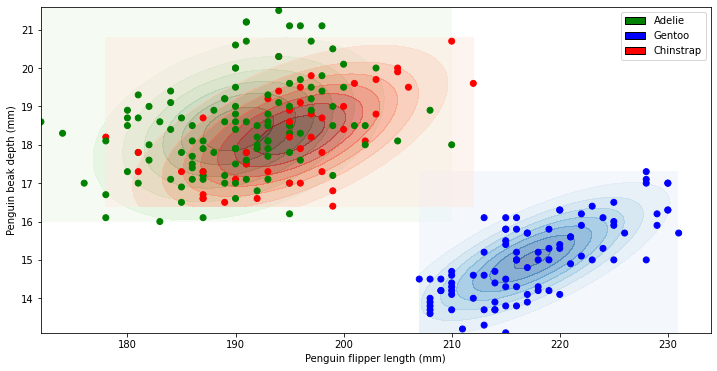

In [95]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
plt.figure(figsize=(12,6))
plt.contourf(x, y, z, cmap='Greens',alpha=0.5)
plt.contourf(x2, y2, z2, cmap='Blues',alpha=0.5)
plt.contourf(x3, y3, z3, cmap='Reds',alpha=0.5)
plt.xlabel("Penguin flipper length (mm)")
plt.ylabel("Penguin beak depth (mm)")
plt.legend(handles=legend_elements)
plt.scatter(penguins_train["Flipper Length (mm)"], penguins_train["Beak Depth (mm)"] , color = penguins_train.Species.map(colors)  )
plt.show()

In [35]:
train1

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
3,53,Adelie,Biscoe,42.0,19.5,200.0,4050.0,MALE,True,False,False
4,86,Adelie,Dream,36.3,19.5,190.0,3800.0,MALE,True,False,False
5,119,Adelie,Torgersen,41.1,18.6,189.0,3325.0,MALE,True,False,False
6,29,Adelie,Biscoe,40.5,18.9,180.0,3950.0,MALE,True,False,False
7,28,Adelie,Biscoe,37.9,18.6,172.0,3150.0,FEMALE,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...
243,56,Adelie,Biscoe,39.0,17.5,186.0,3550.0,FEMALE,True,False,False
247,68,Adelie,Torgersen,35.9,16.6,190.0,3050.0,FEMALE,True,False,False
249,51,Adelie,Biscoe,40.1,18.9,188.0,4300.0,MALE,True,False,False
254,1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE,True,False,False


In [37]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis 
from sklearn import datasets
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [36]:
one = train1[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]]
two = train1["SP1"]

In [38]:
model = QuadraticDiscriminantAnalysis()
model.fit(one, two)

ValueError: The number of classes has to be greater than one; got 1 class

In [40]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.colors as colors
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
from sklearn import linear_model, datasets
import seaborn as sns
import itertools
iris = sns.load_dataset("iris")

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:703: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_args = [v for k, v in plot_data.iteritems()]


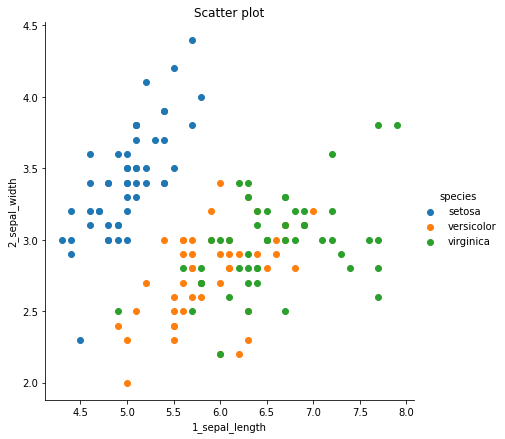

In [41]:
iris = iris.rename(index = str, columns = {'sepal_length':'1_sepal_length','sepal_width':'2_sepal_width', 'petal_length':'3_petal_length', 'petal_width':'4_petal_width'})
sns.FacetGrid(iris, hue="species", size=6) .map(plt.scatter,"1_sepal_length", "2_sepal_width", )  .add_legend()
plt.title('Scatter plot')
df1 = iris[["1_sepal_length", "2_sepal_width",'species']]

In [53]:
penguins_train

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,287,Gentoo,Biscoe,49.5,16.2,229.0,5800.0,MALE,False,True,False
1,307,Gentoo,Biscoe,51.3,14.2,218.0,5300.0,MALE,False,True,False
2,291,Gentoo,Biscoe,46.4,15.6,221.0,5000.0,MALE,False,True,False
3,53,Adelie,Biscoe,42.0,19.5,200.0,4050.0,MALE,True,False,False
4,86,Adelie,Dream,36.3,19.5,190.0,3800.0,MALE,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...
252,323,Gentoo,Biscoe,49.1,15.0,228.0,5500.0,MALE,False,True,False
253,270,Gentoo,Biscoe,46.6,14.2,210.0,4850.0,FEMALE,False,True,False
254,1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE,True,False,False
255,169,Chinstrap,Dream,58.0,17.8,181.0,3700.0,FEMALE,False,False,True


In [64]:
one = penguins_train[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]]
two = penguins_train["Species"]

In [65]:
model = QuadraticDiscriminantAnalysis()
model.fit(one, two)

QuadraticDiscriminantAnalysis()

In [56]:
penguins_train.loc[0]

Unnamed: 0                287
Species                Gentoo
Island                 Biscoe
Beak Length (mm)         49.5
Beak Depth (mm)          16.2
Flipper Length (mm)     229.0
Body Mass (g)          5800.0
Sex                      MALE
SP1                     False
SP2                      True
SP3                     False
Name: 0, dtype: object

In [67]:
new = [49.5,16.2,229,5800]
model.predict([new])[0]

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(


'Gentoo'

In [59]:
iris = datasets.load_iris()

#convert dataset to pandas DataFrame
df = pd.DataFrame(data = np.c_[iris['data'], iris['target']],
                 columns = iris['feature_names'] + ['target'])
df['species'] = pd.Categorical.from_codes(iris.target, iris.target_names)
df.columns = ['s_length', 's_width', 'p_length', 'p_width', 'target', 'species']

#view first six rows of DataFrame
df.head()

,s_length,s_width,p_length,p_width,target,species
0,5.1,3.5,1.4,0.2,0.0,setosa
1,4.9,3.0,1.4,0.2,0.0,setosa
2,4.7,3.2,1.3,0.2,0.0,setosa
3,4.6,3.1,1.5,0.2,0.0,setosa
4,5.0,3.6,1.4,0.2,0.0,setosa


In [60]:
X = df[['s_length', 's_width', 'p_length', 'p_width']]
y = df['species']

#Fit the QDA model
model = QuadraticDiscriminantAnalysis()
model.fit(X, y)

QuadraticDiscriminantAnalysis()

In [61]:
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

#evaluate model
scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
print(np.mean(scores)) 

0.9733333333333334


In [107]:
penguins_train.describe()

,Unnamed: 0,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g)
count,256.000000,256.000000,256.000000,256.000000,256.000000
mean,169.187500,43.752344,17.177344,200.820312,4188.671875
std,100.574604,5.414403,1.961321,14.207666,806.078983
min,0.000000,33.100000,13.100000,172.000000,2700.000000
25%,83.250000,39.200000,15.700000,190.000000,3550.000000
50%,165.000000,43.500000,17.300000,197.000000,4000.000000
75%,260.250000,48.250000,18.600000,214.000000,4762.500000
max,343.000000,59.600000,21.500000,231.000000,6050.000000


In [118]:
xgrid = np.arange(172, 231.1,0.1) # range for flipper length
ygrid = np.arange(13.1,21.3,0.1)  # range for beak depth
xax, yax = np.meshgrid(xgrid, ygrid, indexing="ij")
z = np.zeros(xax.shape)
print(xax.shape, yax.shape, z.shape)
for i in range(len(xgrid)):
    for j in range(len(ygrid)):
        x = np.array([mean2, ygrid[j],xgrid[i],mean1])
       # print(x)
        z[i,j]= QDA(x)

(591, 82) (591, 82) (591, 82)


/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

In [97]:
one = penguins_train[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]]
two = penguins_train["Species"]

In [98]:
model = QuadraticDiscriminantAnalysis()
model.fit(one, two)

QuadraticDiscriminantAnalysis()

In [101]:
def QDA(a):
    c = model.predict([a])[0]
    if c == "Adelie":
        g=0
    elif c == "Gentoo":
        g=1
    elif c == "Chinstrap":
        g=2
    return(g)

In [102]:
mean0 = penguins_train["Beak Depth (mm)"].mean()
mean1 = penguins_train["Body Mass (g)"].mean() 
mean2 = penguins_train['Beak Length (mm)'].mean()
mean3 = penguins_train["Flipper Length (mm)"].mean()

In [104]:
z

array([[2., 2., 2., ..., 0., 0., 0.],
       [2., 2., 2., ..., 0., 0., 0.],
       [2., 2., 2., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

Text(0, 0.5, 'Beak Depth (mm)')

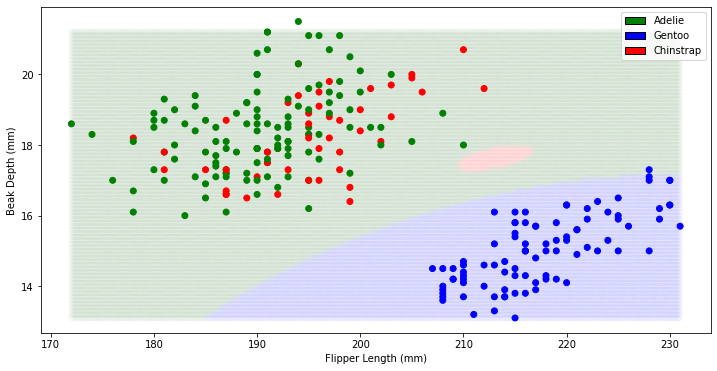

In [120]:
plt.figure(figsize=(12,6))
colorsnum = { 0 : "green", 1: "blue", 2: "red"}
c = [colorsnum[i] for i in z.reshape(-1)]
plt.scatter(xax,yax, color=c, alpha=0.01)
plt.scatter(penguins["Flipper Length (mm)"], penguins["Beak Depth (mm)"] , color = penguins.Species.map(colors)  )
plt.legend(handles=legend_elements)
plt.xlabel("Flipper Length (mm)")
plt.ylabel( "Beak Depth (mm)")

In [116]:
xgrid = np.arange(33.1,59.7,0.1) # range for beak length
ygrid = np.arange(13.1,21.3,0.1)  # range for beak depth
xax, yax = np.meshgrid(xgrid, ygrid, indexing="ij")
z = np.zeros(xax.shape)
print(xax.shape, yax.shape, z.shape)
for i in range(len(xgrid)):
    for j in range(len(ygrid)):
        x = np.array([xgrid[i], ygrid[j],mean3,mean1])
       # print(x)
        z[i,j]= QDA(x)

(266, 82) (266, 82) (266, 82)


/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(
/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalys

Text(0, 0.5, 'Beak Depth (mm)')

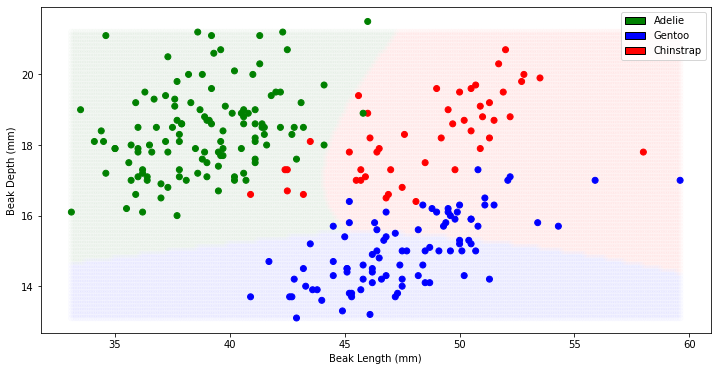

In [117]:
plt.figure(figsize=(12,6))
colorsnum = { 0 : "green", 1: "blue", 2: "red"}
c = [colorsnum[i] for i in z.reshape(-1)]
plt.scatter(xax,yax, color=c, alpha=0.01)
plt.scatter(penguins["Beak Length (mm)"], penguins["Beak Depth (mm)"] , color = penguins.Species.map(colors)  )
plt.legend(handles=legend_elements)
plt.xlabel("Beak Length (mm)")
plt.ylabel( "Beak Depth (mm)")

In [113]:
penguins_train.head(5)

,Unnamed: 0,Species,Island,Beak Length (mm),Beak Depth (mm),Flipper Length (mm),Body Mass (g),Sex,SP1,SP2,SP3
0,287,Gentoo,Biscoe,49.5,16.2,229.0,5800.0,MALE,False,True,False
1,307,Gentoo,Biscoe,51.3,14.2,218.0,5300.0,MALE,False,True,False
2,291,Gentoo,Biscoe,46.4,15.6,221.0,5000.0,MALE,False,True,False
3,53,Adelie,Biscoe,42.0,19.5,200.0,4050.0,MALE,True,False,False
4,86,Adelie,Dream,36.3,19.5,190.0,3800.0,MALE,True,False,False


In [115]:
def QDA(a):
    c = model.predict([a])[0]
    if c == "Adelie":
        g=0
    elif c == "Gentoo":
        g=1
    elif c == "Chinstrap":
        g=2
    return(g)

/Users/maxsaint/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but QuadraticDiscriminantAnalysis was fitted with feature names
  warnings.warn(


array(['Gentoo'], dtype=object)

In [ ]:
one = penguins_train[["Beak Length (mm)","Beak Depth (mm)","Flipper Length (mm)","Body Mass (g)"]]
two = penguins_train["Species"]